In [2]:
%matplotlib inline

from __future__ import division, print_function
import numpy as np
import random
from astropy.table import Table
import matplotlib.pyplot as plt
import fitsio
from astropy.io import fits
import healpy as hp
from scipy.interpolate import interp1d
import sys, os, warnings
from astropy.coordinates import SkyCoord


sys.path.append(os.path.expanduser("~")+'/DESI/matches/')
from main_def import cut, flux_to_mag
from main_def_2 import relative_density_plot, circular_mask_radii_func, search_around, make_cutout_table
from main_def_2 import overdensity, extract_annulus, flux_to_mag, get_mag_decals, scatter_plot
from main_def_2 import make_plot_zoom, make_plot_zoom_comp

from kdcount import KDTree
from veto import veto, veto_ellip, match

from astropy import units as u

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}

import matplotlib
matplotlib.rc('font', **font)

sys.path.insert(0, '/global/homes/q/qmxp55/DESI/matches/quality_cuts/')
from extract_bgs import _prepare_optical_wise, _psflike

## Loading general catalogue with rmag limit on 21 

This catalogue is the same we've been using for SV tests covering a 1400 deg$^2$ with the only cut in rmag of 21.
    
$$160 < RA < 230$$
$$-2 < DEC < 18$$

In [3]:
cat0 = np.load('/global/homes/q/qmxp55/DESI/matches/BGS_SV/cat0_160_230_-2_18_rmag_21.npy')

## Preparing the BGS catalogue

In [4]:
def isBGS(gflux=None, rflux=None, zflux=None, w1flux=None, w2flux=None, rfiberflux=None,
          gnobs=None, rnobs=None, znobs=None, gfracmasked=None, rfracmasked=None, zfracmasked=None,
          gfracflux=None, rfracflux=None, zfracflux=None, gfracin=None, rfracin=None, zfracin=None,
          gfluxivar=None, rfluxivar=None, zfluxivar=None, brightstarinblob=None, Grr=None,
          w1snr=None, gaiagmag=None, objtype=None, primary=None, south=True, targtype=None):
    """Definition of BGS target classes. Returns a boolean array.

    Parameters
    ----------
    south : :class:`boolean`, defaults to ``True``
        Use cuts appropriate to the Northern imaging surveys (BASS/MzLS) if ``south=False``,
        otherwise use cuts appropriate to the Southern imaging survey (DECaLS).
    targtype : :class:`str`, optional, defaults to ``faint``
        Pass ``bright`` to use colors appropriate to the ``BGS_BRIGHT`` selection
        or ``faint`` to use colors appropriate to the ``BGS_FAINT`` selection
        or ``faint_ext`` to use colors appropriate to the ``BGS_FAINT_EXTENDED`` selection
	or ``lowq`` to use colors appropriate to the ``BGS_LOW_QUALITY`` selection
	or ``fibmag`` to use colors appropriate to the ``BGS_FIBER_MAGNITUDE`` selection.

    Returns
    -------
    :class:`array_like`
        ``True`` if and only if the object is a BGS target of type ``targtype``.

    Notes
    -----
    - Current version (11/05/18) is version 24 on `the SV wiki`_.
    - See :func:`~desitarget.sv1.sv1_cuts.set_target_bits` for other parameters.
    """
    #_check_BGS_targtype_sv(targtype)

    # ------ Bright Galaxy Survey
    if primary is None:
        primary = np.ones_like(rflux, dtype='?')
    bgs = primary.copy()

    bgs &= notinBGS_mask(gflux=gflux, rflux=rflux, zflux=zflux, gnobs=gnobs, rnobs=rnobs, znobs=znobs, primary=primary,
                         gfracmasked=gfracmasked, rfracmasked=rfracmasked, zfracmasked=zfracmasked,
                         gfracflux=gfracflux, rfracflux=rfracflux, zfracflux=zfracflux,
                         gfracin=gfracin, rfracin=rfracin, zfracin=zfracin, w1snr=w1snr,
                         gfluxivar=gfluxivar, rfluxivar=rfluxivar, zfluxivar=zfluxivar, Grr=Grr,
                         gaiagmag=gaiagmag, brightstarinblob=brightstarinblob, objtype=objtype, targtype=targtype)
    

    bgs &= isBGS_colors(rflux=rflux, rfiberflux=rfiberflux, south=south, targtype=targtype, primary=primary)
        
    return bgs 


def notinBGS_mask(gflux=None, rflux=None, zflux=None, gnobs=None, rnobs=None, znobs=None, primary=None,
                  gfracmasked=None, rfracmasked=None, zfracmasked=None,
                  gfracflux=None, rfracflux=None, zfracflux=None,
                  gfracin=None, rfracin=None, zfracin=None, w1snr=None,
                  gfluxivar=None, rfluxivar=None, zfluxivar=None, Grr=None,
                  gaiagmag=None, brightstarinblob=None, objtype=None, targtype=None):
    """Standard set of masking cuts used by all BGS target selection classes
    (see, e.g., :func:`~desitarget.cuts.isBGS_faint` for parameters).
    """
    #_check_BGS_targtype_sv(targtype)

    if primary is None:
        primary = np.ones_like(gnobs, dtype='?')
    bgs_qcs = primary.copy()
    bgs = primary.copy()

    # quality cuts definitions
    bgs_qcs &= (gnobs >= 1) & (rnobs >= 1) & (znobs >= 1)
    bgs_qcs &= (gfracmasked < 0.4) & (rfracmasked < 0.4) & (zfracmasked < 0.4)
    bgs_qcs &= (gfracflux < 5.0) & (rfracflux < 5.0) & (zfracflux < 5.0)
    bgs_qcs &= (gfracin > 0.3) & (rfracin > 0.3) & (zfracin > 0.3)
    bgs_qcs &= (gfluxivar > 0) & (rfluxivar > 0) & (zfluxivar > 0)
    bgs_qcs &= ~brightstarinblob
    
    bgs_qcs &= rflux > gflux * 10**(-1.0/2.5)
    bgs_qcs &= rflux < gflux * 10**(4.0/2.5)
    bgs_qcs &= zflux > rflux * 10**(-1.0/2.5)
    bgs_qcs &= zflux < rflux * 10**(4.0/2.5)
    
    if targtype == 'lowq':
        bgs &= Grr > 0.6
        bgs |= gaiagmag == 0
        bgs |= (Grr < 0.6) & (~_psflike(objtype)) & (gaiagmag != 0)
        bgs &= ~bgs_qcs
    elif targtype == 'bgs_bqc':
        bgs &= Grr > 0.6
        bgs |= gaiagmag == 0
        bgs |= (Grr < 0.6) & (~_psflike(objtype)) & (gaiagmag != 0)
    else:
        bgs &= Grr > 0.6
        bgs |= gaiagmag == 0
        bgs |= (Grr < 0.6) & (~_psflike(objtype)) & (gaiagmag != 0)
        bgs &= bgs_qcs

    return bgs


def isBGS_colors(rflux=None, rfiberflux=None, south=True, targtype=None, primary=None):
    """Standard set of masking cuts used by all BGS target selection classes
    (see, e.g., :func:`~desitarget.cuts.isBGS` for parameters).
    """

    if primary is None:
        primary = np.ones_like(rflux, dtype='?')
    bgs = primary.copy()

    if targtype == 'lowq':
        bgs &= rflux > 10**((22.5-21.0)/2.5)
    elif targtype == 'bright':
        bgs &= rflux > 10**((22.5-19.5)/2.5)
    elif targtype == 'faint':
        bgs &= rflux > 10**((22.5-20.1)/2.5)
        bgs &= rflux <= 10**((22.5-19.5)/2.5)
    elif targtype == 'faint_ext':
        bgs &= rflux > 10**((22.5-20.5)/2.5)
        bgs &= rflux <= 10**((22.5-20.1)/2.5)
    elif targtype == 'fibmag':
        bgs &= rflux <= 10**((22.5-20.1)/2.5)
        bgs &= rfiberflux > 10**((22.5-21.0511)/2.5)
    elif targtype == 'all':
        bgs &= rflux > 10**((22.5-21.0)/2.5)
    elif targtype == 'bgs_bqc':
        bgs &= rflux > 10**((22.5-21.0)/2.5)

    return bgs


In [5]:
def get_targtype(CAT, tarty):
    
    (obs_rflux, gflux, rflux, zflux,
            w1flux, w2flux, rfiberflux, objtype, release, gfluxivar, rfluxivar, zfluxivar,
            gnobs, rnobs, znobs, gfracflux, rfracflux, zfracflux,
            gfracmasked, rfracmasked, zfracmasked,
            gfracin, rfracin, zfracin, gallmask, rallmask, zallmask,
            gsnr, rsnr, zsnr, w1snr, w2snr, dchisq, deltaChi2, brightstarinblob, gaiagmag,
            Grr) = _prepare_optical_wise(CAT)
    
    BGS = isBGS(gflux=gflux, rflux=rflux, zflux=zflux, w1flux=w1flux, w2flux=w2flux,
                    rfiberflux=rfiberflux, gnobs=gnobs, rnobs=rnobs, znobs=znobs,
                    gfracmasked=gfracmasked, rfracmasked=rfracmasked, zfracmasked=zfracmasked,
                    gfracflux=gfracflux, rfracflux=rfracflux, zfracflux=zfracflux,
                    gfracin=gfracin, rfracin=rfracin, zfracin=zfracin,
                    gfluxivar=gfluxivar, rfluxivar=rfluxivar, zfluxivar=zfluxivar,
                    brightstarinblob=brightstarinblob, Grr=Grr, w1snr=w1snr, gaiagmag=gaiagmag,
                    objtype=objtype, primary=None, south=True, targtype=tarty)
    
    return BGS

## Getting BGS with and without quality cuts

In [6]:
rmag = flux_to_mag(cat0['FLUX_R']/cat0['MW_TRANSMISSION_R'])

BRIGHT = np.ones_like(rmag, dtype='?')
FAINT = np.ones_like(rmag, dtype='?')
BRIBLOB = np.ones_like(rmag, dtype='?')

BRIGHT = rmag < 19.5
FAINT = np.logical_and(rmag > 19.5, rmag < 21.0)
BRIBLOB = cat0['BRIGHTSTARINBLOB']

In [7]:
lowq = get_targtype(cat0, 'lowq') #this are the objects rejected by th quality cuts
bgs_bqc = get_targtype(cat0, 'bgs_bqc') #bgs selection without quality cuts applied
bgs_aqc = get_targtype(cat0, 'bgs_all') #bgs selection with quality cuts applied

Check that catalogues with and without quaity cuts are OK.

In [8]:
if np.abs((np.sum(bgs_aqc) + np.sum(lowq)) - (np.sum(bgs_bqc))) != 0:
    print('Something when wrong. Catalogues are not congruents')
else:
    print('Everything is fine. Catalogues are congruents')

Everything is fine. Catalogues are congruents


In [17]:
def get_postages(CAT, N, M, get_coord=False, rand=True, other_cat=None):
    '''
    Get postage images tables with sizes NXM.
    inputs
    -------
    CAT: (array) Catalogue
    N: (integer) Number of rows
    M: (integer) Number of columns
    
    outputs
    -------
    Table of size NXM of postage images froma random sample of catalogue
    
    '''
    
    import random
    
    table = (N,M)
    boxsize = 180
    
    #rMag = CAT['MAG_VT']
    rMag = flux_to_mag(CAT['FLUX_R']/CAT['MW_TRANSMISSION_R'])
    RA, DEC = CAT['RA'], CAT['DEC']

    if rand:
        ranSelect = random.sample(range(len(RA)), N*M)
    else:
        MASK = np.ones_like(RA, dtype='?')
        N = np.linspace(0, len(RA)-1, N*M, dtype=np.int32)
        MASK[N] = False
        ranSelect = ~MASK
        
    make_cutout_table(RA[ranSelect], DEC[ranSelect], rMag[ranSelect], 'mag', table, False, boxsize=boxsize, 
                  layer='decals-dr7', layer2=None, savefile=None, other_cat=other_cat)

    #make_cutout_table(RA[ranSelect], DEC[ranSelect], rMag[ranSelect], 'r', table, False, boxsize=20, 
    #              layer='decals-dr7-model', layer2=None, savefile=None)

    if get_coord:
        return np.array([RA[ranSelect], DEC[ranSelect]])

pixels: 687
A total of 2762 objects were found within the 180" boxsize of the 20 postages


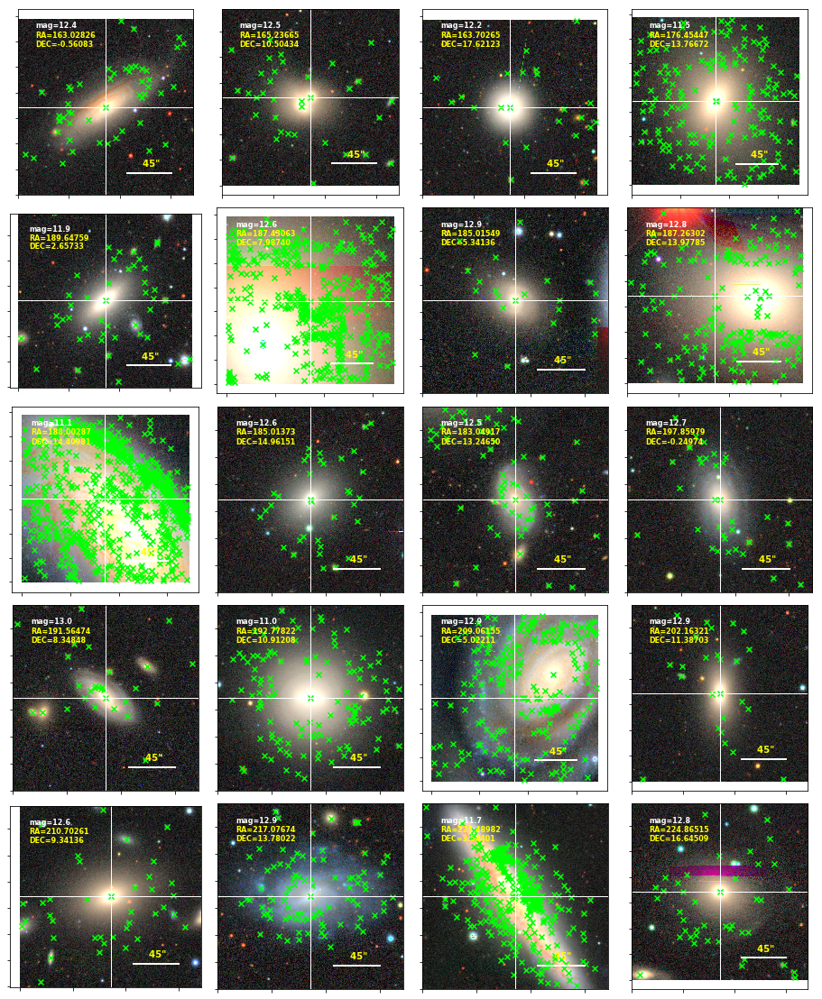

In [21]:
get_postages(cat0[(bgs_aqc) & (rmag > 10) & (rmag < 13)], 5,4, rand=False, other_cat=cat0[(bgs_bqc)])

pixels: 687
A total of 1032 objects were found within the 180" boxsize of the 20 postages


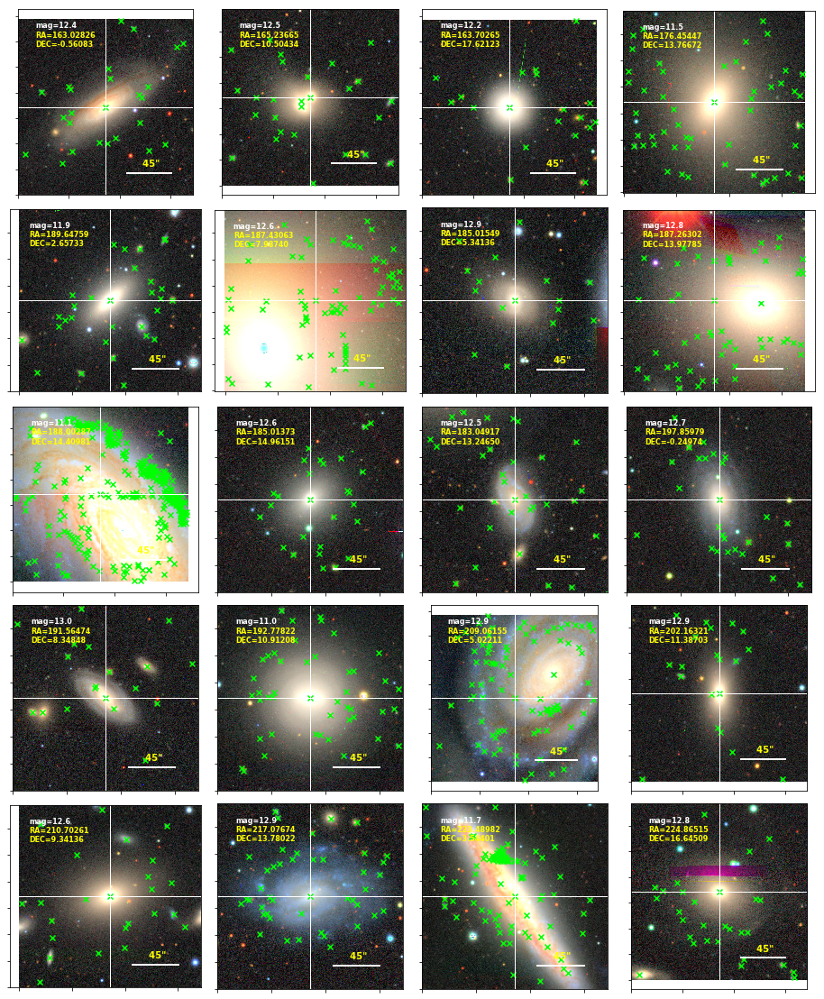

In [22]:
get_postages(cat0[(bgs_aqc) & (rmag > 10) & (rmag < 13)], 5,4, rand=False, other_cat=cat0[(bgs_aqc)])

In [20]:
from astropy.utils.data import download_file  #import file from URL
from matplotlib.ticker import NullFormatter

def make_cutout_table(ra_in, dec_in, other=None, othername=None, table=(2,7), compare=False,
                      scale_unit='pixscale', boxsize=30, scale=0.262, layer='decals-dr7', 
                      layer2=None, savefile=None, other_cat=None):
    """
    Produces a table comparing LEGACY survey images.
    To see the different layers see: https://github.com/yymao/decals-image-list-tool/blob/master/index.html

    Keyword arguments:
    ra_in            -- array-like: RA positions in degrees
    dec_in           -- array-like: DEC positions in degrees
    other            -- array-like: any other parameter, e.g. magnitude
    othername        -- string: name or label of the 'other' parameter
    table            -- 2D integer array: arrange of the output images in (rows * columns) form
    compare          -- boolean: True if want to get output images comparing with other layer (currently in test mode)
    scale_unit       -- striing: pixel scale default
    scale            -- float: 1:180 arcsec
    layer            -- string: type of layer from legacysurvey. e.g:
                            ls-dr67:Legacy Survey DR6+7
                            decals-dr7:DECaLS DR7
                            decals-dr7-model:DECaLS DR7 Model
                            decals-dr7-resid:DECaLS DR7 Residual
                            mzls+bass-dr6:MzLS+BASS DR6
                            mzls+bass-dr6-model:MzLS+BASS DR6 Model
                            mzls+bass-dr6-resid:MzLS+BASS DR6 Residual
    layer2            -- string: second layer to compare if 'compare=True'
    savefile          -- string: path of output image and pdf if any
    """
    de_img = []
    wi_img = []
    N = table[0]*table[1]
    size = int(round(boxsize/scale))
    print('pixels:',size)
    
    if other_cat != None:
        selects = []
        for i in range(len(ra_in)):
            
            delta = -1.
            MASK = np.ones_like(other_cat, dtype='?')
            MASK &= np.logical_and(other_cat['RA'] < ra_in[i]+(boxsize/2+delta)/3600, other_cat['RA'] > ra_in[i]-(boxsize/2+delta)/3600)
            MASK &= np.logical_and(other_cat['DEC'] < dec_in[i]+(boxsize/2+delta)/3600, other_cat['DEC'] > dec_in[i]-(boxsize/2+delta)/3600)
            for j in range(len(other_cat['RA'][MASK])):
                ra_pix = size/2 + (ra_in[i]-other_cat['RA'][MASK][j])*3600/scale
                dec_pix = size/2 + (dec_in[i]-other_cat['DEC'][MASK][j])*3600/scale
                selects.append([i, other_cat['RA'][MASK][j], other_cat['DEC'][MASK][j], ra_pix, dec_pix])
                
            
        selects = np.array(selects).transpose()
        print('A total of %i objects were found within the %i" boxsize of the %i postages' %(len(selects[0]), boxsize, len(ra_in)))


    if isinstance(ra_in, float):
        de_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%.12f&dec=%.12f&%s=%g&layer=%s&size=%i' % (ra_in,dec_in, scale_unit, scale, layer, size)
        img = plt.imread(download_file(de_cutout_url,cache=True,show_progress=False,timeout=120))

        fig = plt.figure(figsize=(10,10))
        
        if other != None:
            plt.text(0.1,0.9,'%s=%.1f'%(othername,other),fontsize=14,color='white')

        return

    for i in range(N):
        de_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%.12f&dec=%.12f&%s=%g&layer=%s&size=%g' % (ra_in[i],dec_in[i], scale_unit, scale, layer, size)
        img = plt.imread(download_file(de_cutout_url,cache=True,show_progress=False,timeout=120))
        de_img.append(img)

        if compare:
            wi_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%g&dec=%g&%s=%g&layer=%s&size=%g' % (ra_in[i],dec_in[i], scale_unit, scale, layer2, size)
            img = plt.imread(download_file(wi_cutout_url,cache=True,show_progress=False,timeout=120))
            wi_img.append(img)

    fig = plt.figure(figsize=(4*table[1],4*table[0]))
    
    scale_l = np.array([[size*5/8, size*7/8], [size*1/8, size*1/8]])

    for i in range(len(de_img)):
        ax = fig.add_subplot(table[0],table[1],i+1)
        ax.imshow(de_img[i], origin='lower', aspect='equal')
        ax.axvline(size/2, lw=1, color='white')
        ax.axhline(size/2, lw=1, color='white')
        ax.plot(scale_l[0], scale_l[1], lw=2, color='white')
        ax.text(size*5.7/8, size*1.3/8, '%i" ' %(boxsize/4), color='yellow')
        #ax.grid()
        ax.xaxis.set_major_formatter(NullFormatter())
        ax.yaxis.set_major_formatter(NullFormatter())
        if other_cat != None:
            mask = selects[0] == i
            ax.scatter(selects[3][mask], selects[4][mask], marker='x', color='lime')
            
        if other[i] != None:
            ax.text(0.1,0.9,'%s=%.1f'%(othername,other[i]),transform=ax.transAxes,fontsize=8,color='white')
            ax.text(0.1,0.85,'%s=%.5f'%('RA',ra_in[i]),transform=ax.transAxes,fontsize=8,color='yellow')
            ax.text(0.1,0.8,'%s=%.5f'%('DEC',dec_in[i]),transform=ax.transAxes,fontsize=8,color='yellow')

    plt.subplots_adjust(wspace=0.07, hspace=0.07)

    if compare:
        fig = plt.figure(figsize=(4*table[1],4*table[0]))
        for i in range(len(wi_img)):
            ax = fig.add_subplot(table[0],table[1],i+1)
            ax.imshow(wi_img[i])
            ax.xaxis.set_major_formatter(NullFormatter())
            ax.yaxis.set_major_formatter(NullFormatter())
            if other[i] != None:
                ax.text(0.1,0.9,'%s=%.1f'%(othername,other[i]),transform=ax.transAxes,fontsize=14,color='white')

        plt.subplots_adjust(wspace=0.07, hspace=0.07)

    if savefile != None:
        fig.savefig(savefile +'.png')
        fig.savefig(savefile +'.pdf')

## Check of BRIGHTSTARINBLOB for the randoms

In [9]:
hdu=fitsio.read('/project/projectdirs/desi/target/catalogs/dr7.1/0.22.0/randoms-dr7.1-0.22.0-1.fits')

In [58]:
hdu_S = cut(160, 230, -2,18, hdu)

In [85]:
#print(len(hdu_S[(('MASKBITS') and '0x2') != 0]))
ran_briblob = (np.uint64(hdu_S['MASKBITS']) & np.uint64(0x2))!=0

In [171]:
path = '/global/homes/q/qmxp55/DESI/matches/'
tycho = Table.read(path+'tycho2.fits')
tycho_S = cut(160, 230, -2,18, tycho)

pixels: 573
A total of 176 objects were found within the 150" boxsize of the 16 postages


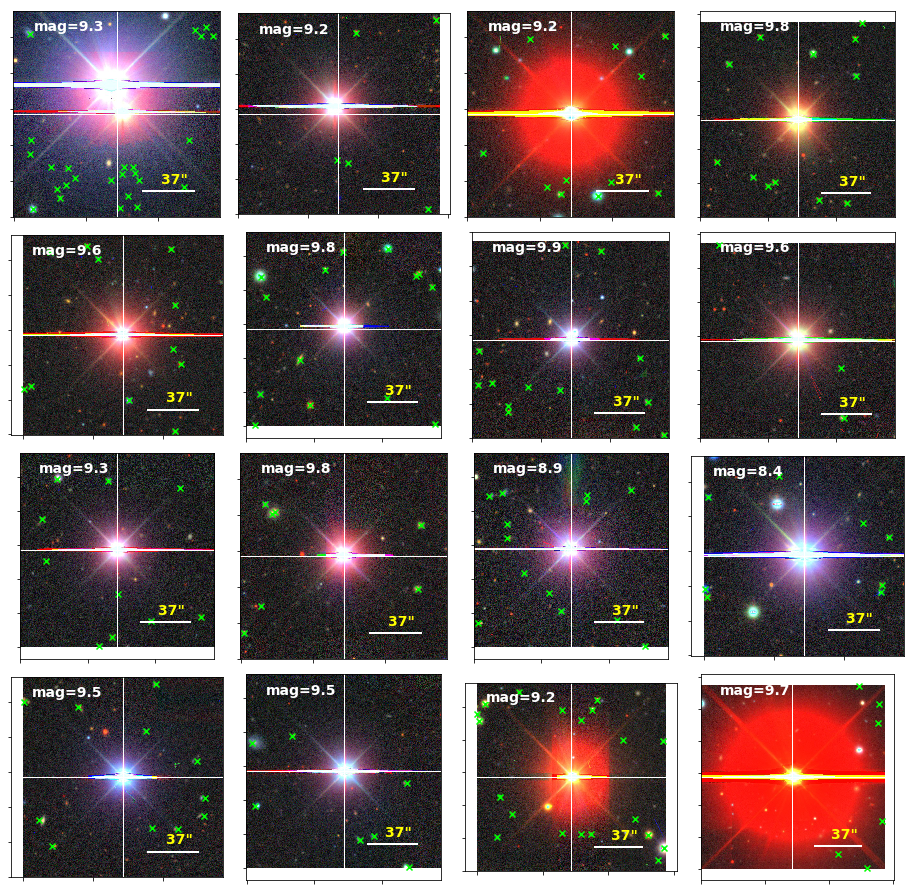

In [172]:
get_postages(tycho_S[(tycho_S['MAG_VT'] > 8) & (tycho_S['MAG_VT'] < 10)], 4,4, rand=False, other_cat=cat0[~BRIBLOB])
#get_postages(tycho_S[(tycho_S['MAG_VT'] > 8) & (tycho_S['MAG_VT'] < 10)], 2,2, rand=False, other_cat=hdu_S[~ran_briblob])

pixels: 573
A total of 146 objects were found within the 150" boxsize of the 16 postages


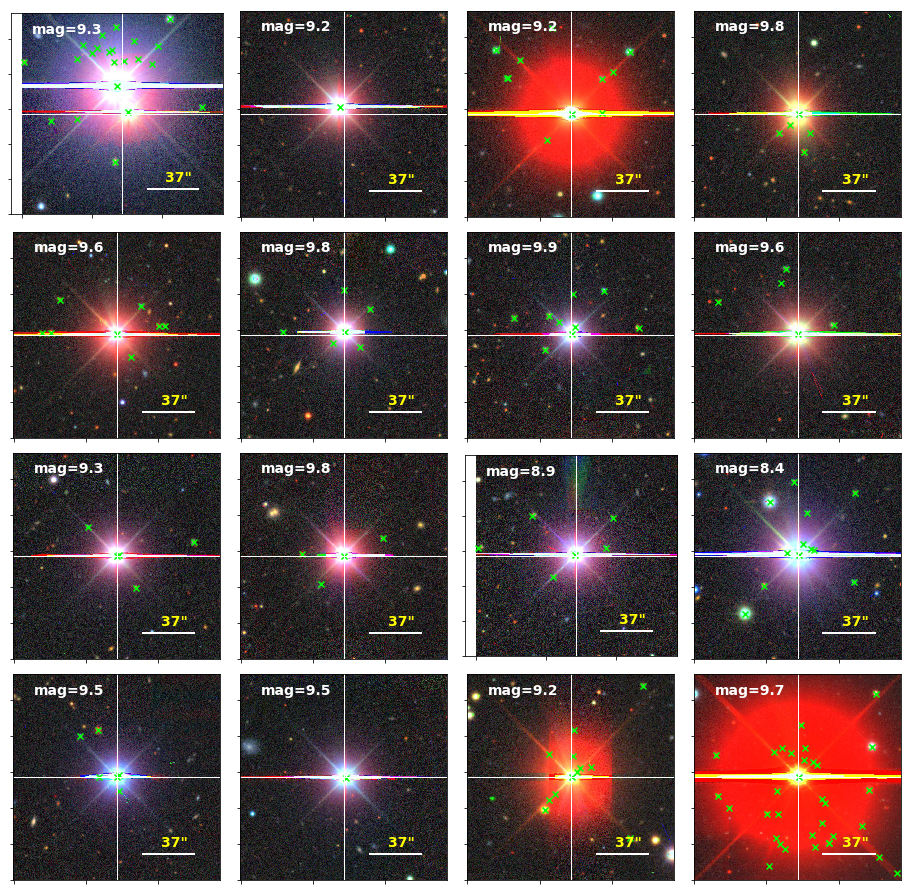

In [173]:
get_postages(tycho_S[(tycho_S['MAG_VT'] > 8) & (tycho_S['MAG_VT'] < 10)], 4,4, rand=False, other_cat=cat0[BRIBLOB])
#get_postages(tycho_S[(tycho_S['MAG_VT'] > 8) & (tycho_S['MAG_VT'] < 10)], 2,2, rand=False, other_cat=hdu_S[ran_briblob])

In [98]:
hdu_temp = cut(200, 220, -5,10, hdu)

In [99]:
ran_briblob_temp = (np.uint64(hdu_temp['MASKBITS']) & np.uint64(0x2))!=0

In [100]:
ran_nobri = Table()

ran_nobri['RA'] = hdu_temp['RA'][~ran_briblob_temp]
ran_nobri['DEC'] = hdu_temp['DEC'][~ran_briblob_temp]

In [105]:
ran_bri = Table()

ran_bri['RA'] = hdu_temp['RA'][ran_briblob_temp]
ran_bri['DEC'] = hdu_temp['DEC'][ran_briblob_temp]

In [108]:
cat_temp = cut(200, 220, -5,10, cat0)

In [109]:
cat_briblob_temp = cat_temp['BRIGHTSTARINBLOB']

In [110]:
cat_bri = Table()

cat_bri['RA'] = cat_temp['RA'][cat_briblob_temp]
cat_bri['DEC'] = cat_temp['DEC'][cat_briblob_temp]

In [112]:
cat_nobri = Table()

cat_nobri['RA'] = cat_temp['RA'][~cat_briblob_temp]
cat_nobri['DEC'] = cat_temp['DEC'][~cat_briblob_temp]

In [113]:
cat_nobri.write('/global/homes/q/qmxp55/DESI/matches/decals_dr7_randoms/cat_nobri.fits', overwrite=True)
print('cat written...')

cat written...


In [154]:
MASK2 = np.ones_like(cat_bri, dtype='?')
N2 = np.linspace(0, len(cat_bri)-1, 5, dtype=np.int32)
MASK2[N2] = False

In [157]:
np.sum(~MASK2)

5

In [152]:
N2

array([    0,  9581, 19163, 28745, 38327], dtype=int32)

# DEV ZONE

http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=198.958377805000&dec=8.769736724520&pixscale=0.2&layer=decals-dr7&size=180


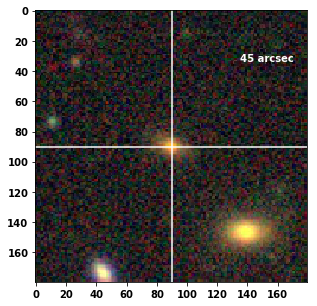

In [187]:
scale_unit='pixscale'
boxsize= 20
scale= 0.2 #0.262
layer='decals-dr7'
size = 180 #int(round(boxsize/scale))
ra = 198.958377805
dec = 8.76973672452

de_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%.12f&dec=%.12f&%s=%g&layer=%s&size=%g' % (ra, dec, scale_unit, scale, layer, size)
print(de_cutout_url)
img = plt.imread(download_file(de_cutout_url,cache=False,show_progress=False,timeout=120))
#print(len(img))

plt.figure(figsize=(5,5))
plt.axvline(size/2, lw=1.5, color='white')
plt.axhline(size/2, lw=1.5, color='white')
plt.text(size*6/8, size*1.5/8, '%i arcsec ' %(size/4), color='white')
plt.imshow(img)

In [194]:
random.sample(range(50), 20)

[2, 37, 35, 18, 15, 3, 28, 14, 22, 10, 36, 38, 44, 19, 21, 33, 12, 46, 25, 47]